In [0]:
#download data to vm
#!mkdir data
#!git clone https://andre-washington:@github.com/andre-washington/fundus_datasets.git ./data

!ls data

In [0]:
#!git clone https://andre-washington:@github.com/andre-washington/fundus_datasets.git ./fundus

In [0]:
#!git config --global user.email "andre.was12@gmail.com"
#!git config --global user.name "andre-washington"

In [0]:
from google.colab import drive
drive.mount('/content/drive')

In [0]:
%load_ext autoreload
%autoreload 2

In [0]:
import os
#import warnings
#warnings.simplefilter('ignore')
from operator import attrgetter
from platform import python_version_tuple

if python_version_tuple()[0] == 3:
    xrange = range

import scipy as sp
import scipy.ndimage
import numpy as np
import pandas as pd
import skimage
import skimage.measure
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import h5py
from tqdm import tqdm_notebook
from IPython.display import display

import sys
sys.path.append('/content/drive/My Drive/scripts_papers/optic-nerve-cnn/scripts')

from extract_data import *

In [0]:
sys.path.append('/content/drive/My Drive/scripts_papers/optic-nerve-cnn')

h5f = h5py.File(os.path.join(os.path.dirname(os.getcwd()), '/content/drive/My Drive/scripts_papers/optic-nerve-cnn/data', 'hdf5_datasets', 'all_data.hdf5'), 'a')

### Exploring data

In [14]:
X, Y, filenames = extract_DRIONS_DB(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'DRIONS-DB'), expert=1)
len(X), X[0].shape, len(Y), Y[0].shape, len(filenames)

(110, (560, 560, 3), 110, (560, 560, 1), 110)

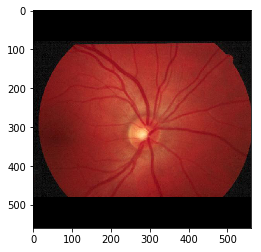

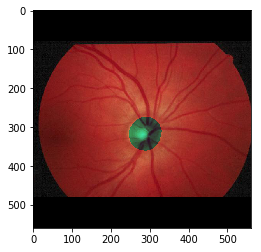

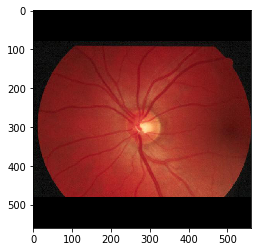

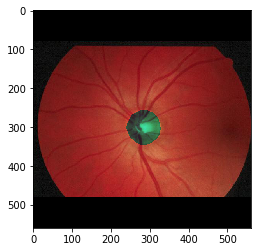

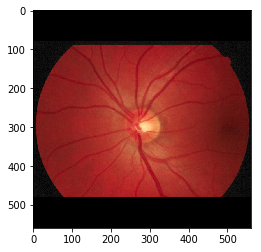

...

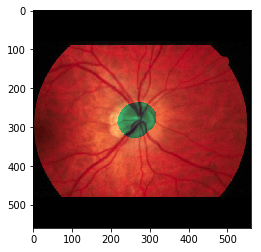

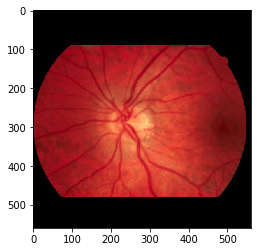

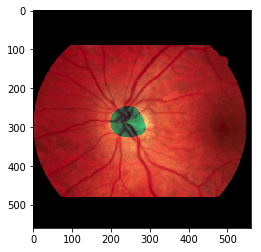

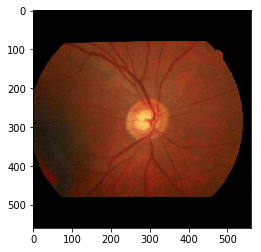

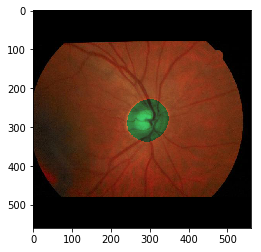

In [15]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(Y[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [16]:
X, Y, filenames, is_ill = extract_RIM_ONE_v2(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'RIM-ONE v2'))
len(X), X[0].shape, len(Y), Y[0].shape, len(filenames), len(is_ill)

(455, (394, 394, 3), 455, (394, 394, 1), 455, 455)

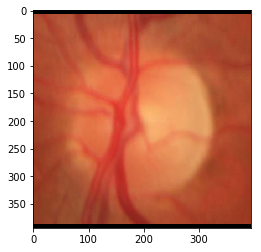

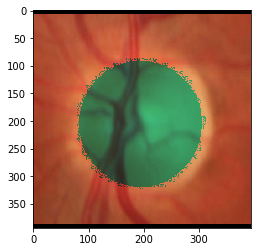

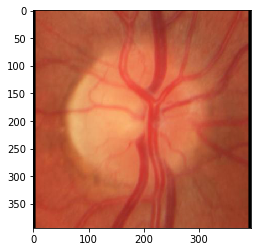

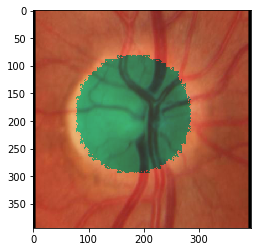

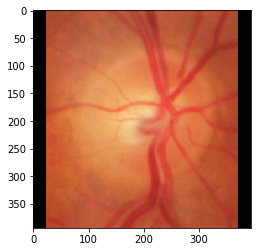

...

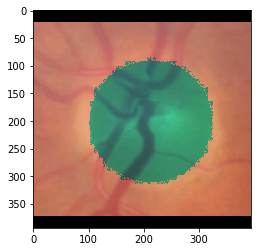

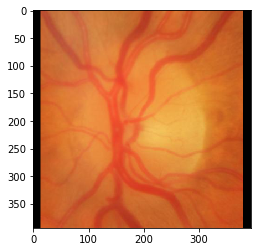

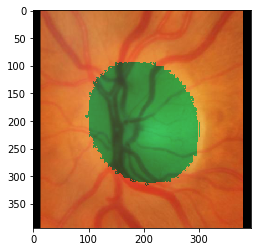

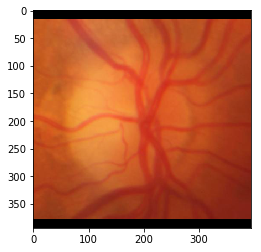

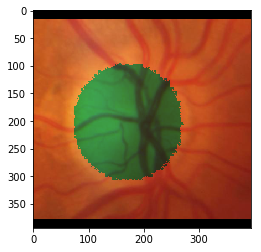

In [0]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(Y[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [0]:
X, disc, cup, filenames, is_ill = extract_RIM_ONE_v3(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'RIM-ONE v3'))
len(X), X[0].shape, len(disc), disc[0].shape, len(cup), cup[0].shape, \
    len(filenames), len(is_ill)

N-1-L


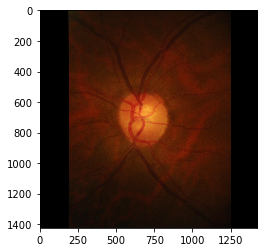

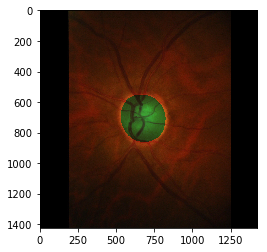

N-10-R


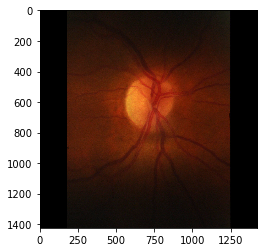

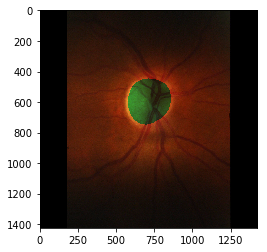

N-11-L


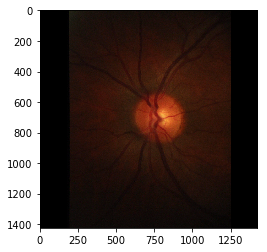

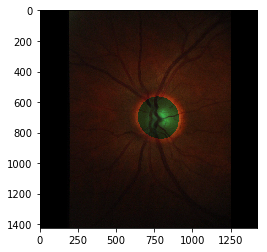

N-12-R


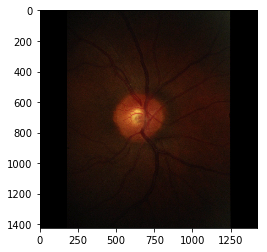

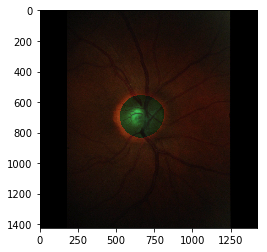

N-13-L


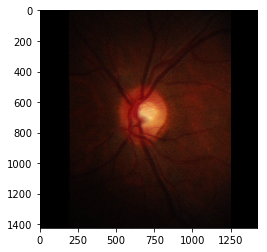

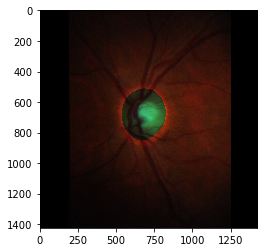

N-14-R


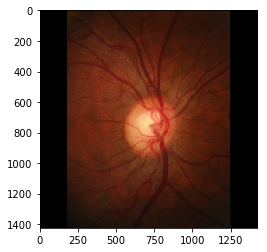

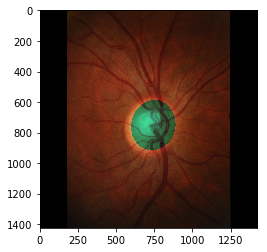

N-16-R


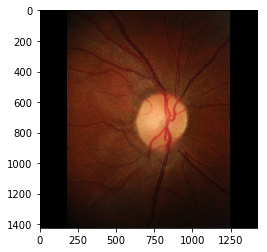

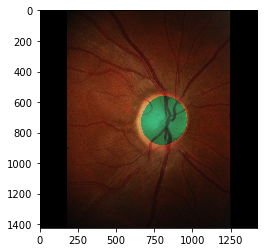

N-17-L


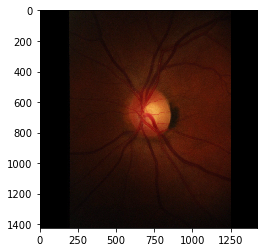

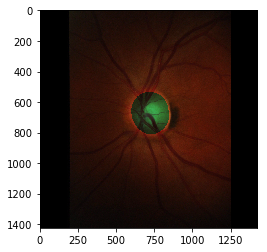

N-18-R


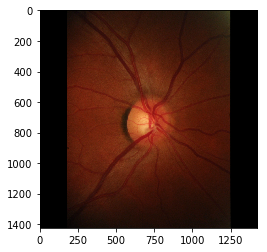

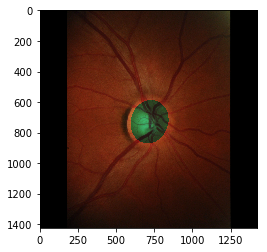

N-2-R


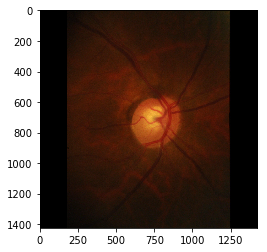

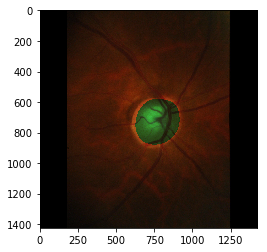

In [0]:
for i in xrange(10):
    print(filenames[i])
    cur = X[i].copy()
    cur[np.where(disc[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [0]:
X, Y, filenames, is_ill = extract_HRF(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'HRF'))
len(X), X[0].shape, len(Y), Y[0].shape, len(filenames), len(is_ill)

(30, (3504, 3504, 3), 30, (3504, 3504, 1), 30, 30)

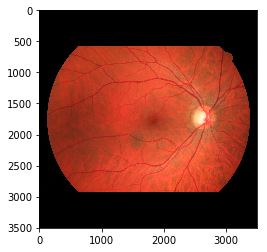

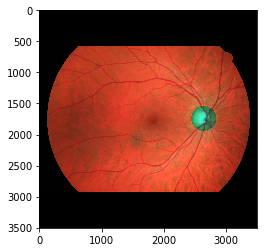

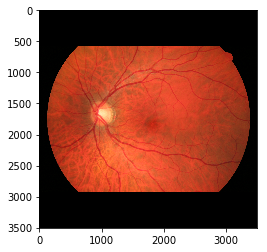

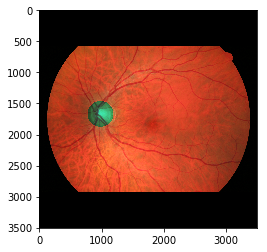

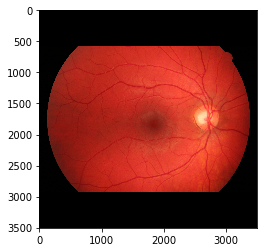

...

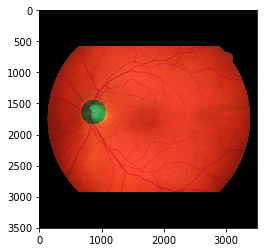

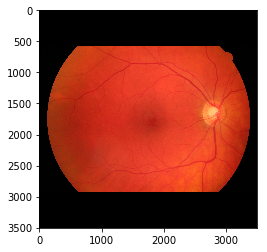

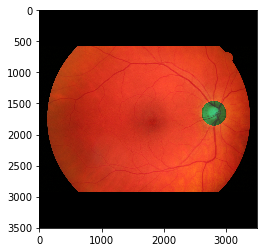

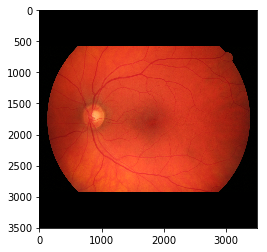

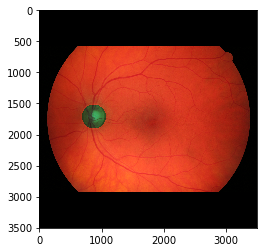

In [0]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(Y[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [0]:
X, disc, cup, file_codes = extract_DRISHTI_GS_train(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'DRISHTI-GS'))
print(len(X), len(disc), len(cup), len(file_codes))
print(len(X), X[0].shape, len(disc), disc[0].shape, len(cup), cup[0].shape, len(file_codes))

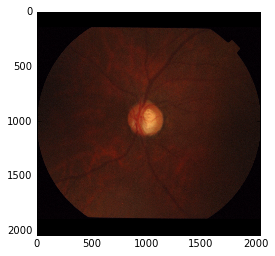

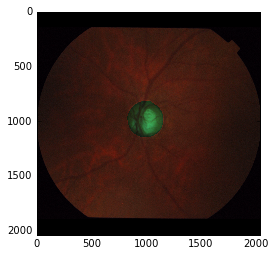

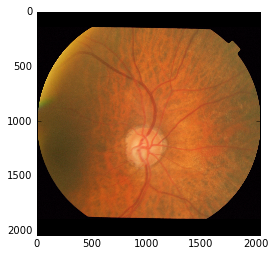

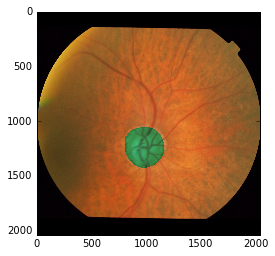

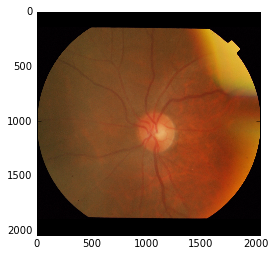

...

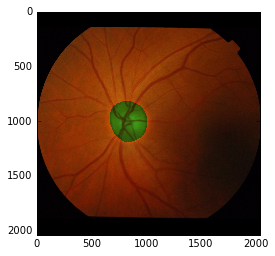

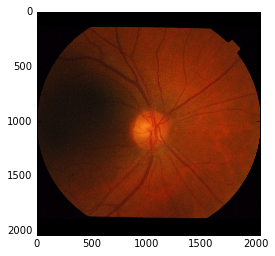

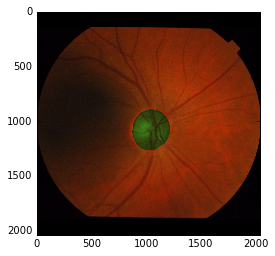

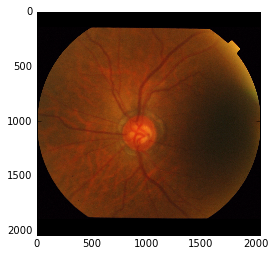

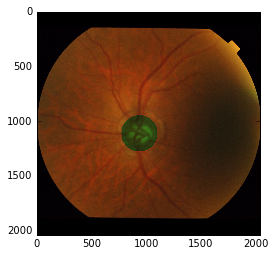

In [0]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(disc[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

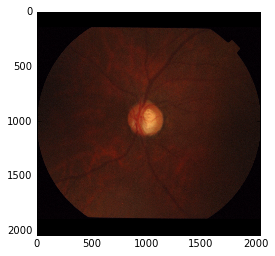

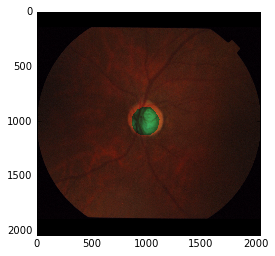

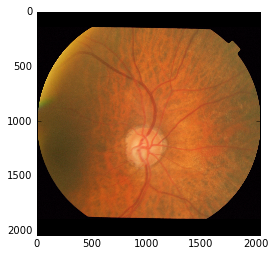

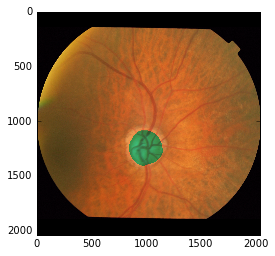

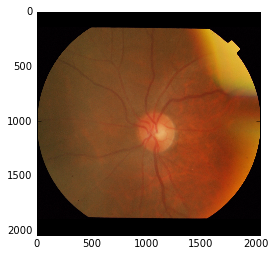

...

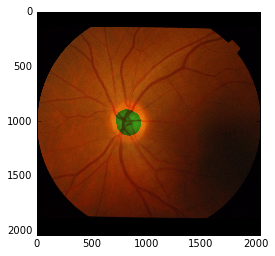

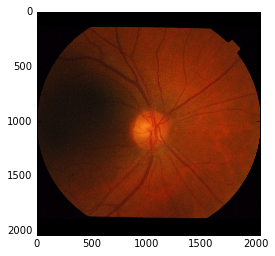

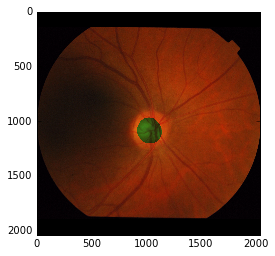

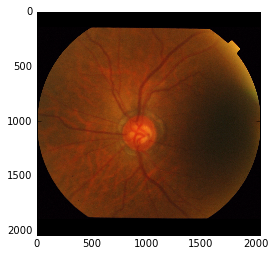

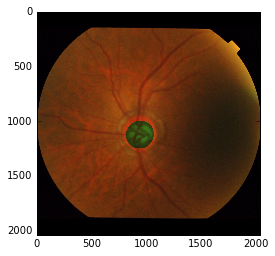

In [0]:
for i in xrange(10):
    cur = X[i].copy()
    cur[np.where(cup[i])] /= 4
    plt.imshow(X[i])
    plt.show()
    plt.imshow(cur)
    plt.show()

In [0]:
X, file_codes = extract_DRISHTI_GS_test(os.path.join(os.path.dirname(os.getcwd()), '/data', 'DRISHTI-GS'))
print(len(X), len(file_codes))
print(len(X), X[0].shape, len(file_codes))

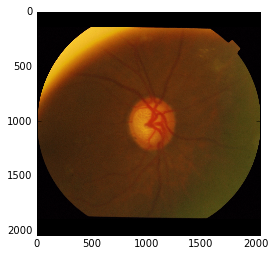

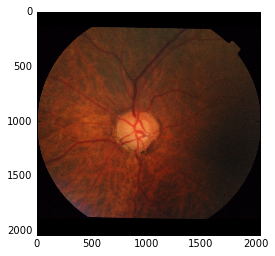

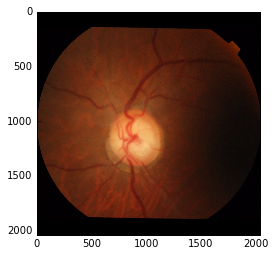

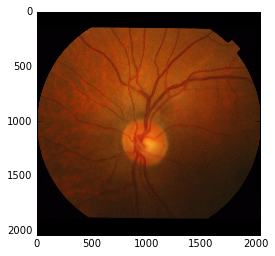

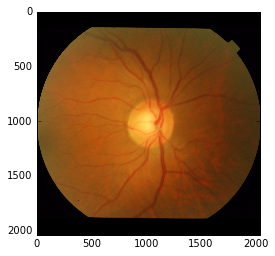

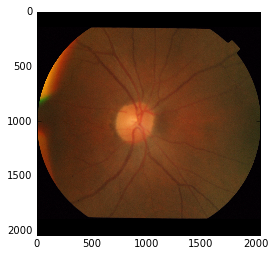

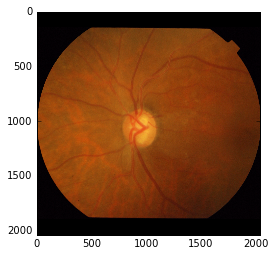

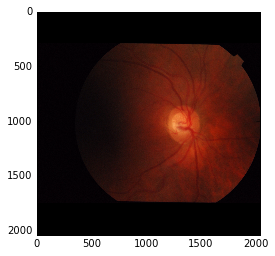

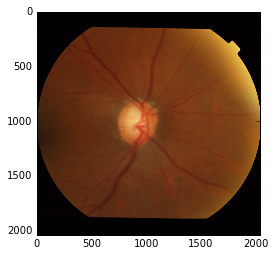

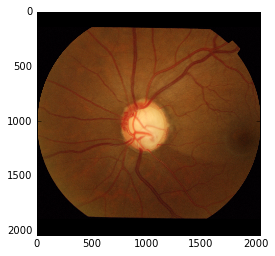

In [0]:
for i in xrange(10):
    plt.imshow(X[i])
    plt.show()

### Saving original data

In [0]:
h5f.create_group("DRIONS-DB/orig")
h5f.create_group("RIM-ONE v2/orig")
h5f.create_group("RIM-ONE v3/orig")
h5f.create_group("HRF/orig")

<HDF5 group "/HRF/orig" (0 members)>

#### DRIONS-DB

In [0]:
X, Y, file_codes = extract_DRIONS_DB(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'DRIONS-DB'), expert=1)
len(X), X[0].shape, len(Y), Y[0].shape, len(file_codes)

In [0]:
resolution = get_resolution_DRIONS_DB()
X_ds = h5f.create_dataset("DRIONS-DB/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("DRIONS-DB/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("DRIONS-DB/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype='S3', compression="gzip")

In [0]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(Y)
file_codes_ds[:] = np.array(file_codes)

In [0]:
train_frac = 0.7

train_idx = np.random.choice(len(X), size=int(train_frac * len(X)), replace=False)
test_idx = np.array(list(set(range(len(X))) - set(train_idx)))
print(train_idx, test_idx)

In [0]:
train_idx_ds = h5f.create_dataset("DRIONS-DB/train_idx", data=train_idx)
test_id_ds = h5f.create_dataset("DRIONS-DB/test_idx", data=test_idx)

In [0]:
#del h5f["DRIONS-DB/orig/images"]
#del h5f["DRIONS-DB/orig/disc"]
#del h5f["DRIONS-DB/orig/file_codes"]

#### RIM-ONE v2

In [0]:
X, Y, file_codes, is_ill = extract_RIM_ONE_v2(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'RIM-ONE v2'))
len(X), X[0].shape, len(Y), Y[0].shape, len(file_codes), len(is_ill)

In [0]:
resolution = get_resolution_RIM_ONE_v2()
str_dt = h5py.special_dtype(vlen=unicode)

X_ds = h5f.create_dataset("RIM-ONE v2/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("RIM-ONE v2/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("RIM-ONE v2/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")
is_ill_ds = h5f.create_dataset("RIM-ONE v2/orig/is_ill", 
                               (len(X),),
                               chunks=True, 
                               dtype='u1', compression="gzip")

In [0]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(Y)
file_codes_ds[:] = np.array(file_codes)
is_ill_ds[:] = np.array(is_ill)

In [0]:
train_frac = 0.7

train_idx = np.random.choice(len(X), size=int(train_frac * len(X)), replace=False)
test_idx = np.array(list(set(range(len(X))) - set(train_idx)))
print(train_idx, test_idx)

In [0]:
print(len(train_idx), len(test_idx), len(file_codes))
print(len(train_idx) + len(test_idx) == len(file_codes))

In [0]:
train_idx_ds = h5f.create_dataset("RIM-ONE v2/train_idx", data=train_idx)
test_id_ds = h5f.create_dataset("RIM-ONE v2/test_idx", data=test_idx)

#### RIM-ONE v3

In [0]:
X, disc, cup, file_codes, is_ill = extract_RIM_ONE_v3(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'RIM-ONE v3'))
len(X), X[0].shape, len(disc), disc[0].shape, len(cup), cup[0].shape, \
    len(file_codes), len(is_ill)

In [0]:
resolution = get_resolution_RIM_ONE_v3()
str_dt = h5py.special_dtype(vlen=unicode)

In [0]:
X_ds = h5f.create_dataset("RIM-ONE v3/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("RIM-ONE v3/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("RIM-ONE v3/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")
is_ill_ds = h5f.create_dataset("RIM-ONE v3/orig/is_ill", 
                               (len(X),),
                               chunks=True, 
                               dtype='u1', compression="gzip")

In [0]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(disc)
file_codes_ds[:] = np.array(file_codes)
is_ill_ds[:] = np.array(is_ill)

In [0]:
cup_ds = h5f.create_dataset("RIM-ONE v3/orig/cup", 
                            (len(X),) + resolution + (1,),  
                            chunks=(2,) + resolution + (1,), 
                            dtype='u1', compression="gzip")

In [0]:
cup_ds[:] = np.array(cup)

In [0]:
driu_imgs, driu_filenames = imh.load_set(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'RIM-ONE v3', 'DRIU results', 'DRIU'))
driu_filecodes = map(lambda s: s[s.rfind('/') + 1:s.rfind('.')], driu_filenames)

In [0]:
test_idx = [file_codes.index(el) for el in driu_filecodes]
train_idx = list(set(range(len(file_codes))) - set(test_idx))
len(train_idx), len(test_idx), len(file_codes)

In [0]:
train_idx_ds = h5f.create_dataset("RIM-ONE v3/train_idx_driu", data=train_idx)
test_idx_ds = h5f.create_dataset("RIM-ONE v3/test_idx_driu", data=test_idx)

#### HRF

In [0]:
X, Y, file_codes, is_ill = extract_HRF(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'HRF'))
len(X), X[0].shape, len(Y), Y[0].shape, len(file_codes), len(is_ill)

In [0]:
resolution = get_resolution_HRF()
str_dt = h5py.special_dtype(vlen=unicode)

X_ds = h5f.create_dataset("HRF/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("HRF/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("HRF/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")
is_ill_ds = h5f.create_dataset("HRF/orig/is_ill", 
                               (len(X),),
                               chunks=True, 
                               dtype='u1', compression="gzip")

In [0]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(Y)
file_codes_ds[:] = np.array(file_codes)
is_ill_ds[:] = np.array(is_ill)

In [0]:
train_frac = 0.7

train_idx = np.random.choice(len(X), size=int(train_frac * len(X)), replace=False)
test_idx = np.array(list(set(range(len(X))) - set(train_idx)))
print(train_idx, test_idx)

In [0]:
print(len(train_idx), len(test_idx), len(file_codes))
print(len(train_idx) + len(test_idx) == len(file_codes))

In [0]:
train_idx_ds = h5f.create_dataset("HRF/train_idx", data=train_idx)
test_idx_ds = h5f.create_dataset("HRF/test_idx", data=test_idx)

#### DRISHTI-GS (train)

In [0]:
X, disc, cup, file_codes = extract_DRISHTI_GS_train(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'DRISHTI_GS'))
len(X), X[0].shape, len(disc), disc[0].shape, len(cup), cup[0].shape, len(file_codes)

In [0]:
resolution = get_resolution_DRISHTI_GS()
str_dt = h5py.special_dtype(vlen=unicode)

In [0]:
X_ds = h5f.create_dataset("DRISHTI-GS/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
disc_ds = h5f.create_dataset("DRISHTI-GS/orig/disc", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
cup_ds = h5f.create_dataset("DRISHTI-GS/orig/cup", 
                             (len(X),) + resolution + (1,),  
                             chunks=(2,) + resolution + (1,), 
                             dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("DRISHTI-GS/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")

In [0]:
X_ds[:] = np.array(X)
disc_ds[:] = np.array(disc)
cup_ds[:] = np.array(cup)
file_codes_ds[:] = np.array(file_codes)

In [0]:
train_frac = 0.7

train_idx = np.random.choice(len(X), size=int(train_frac * len(X)), replace=False)
test_idx = np.array(list(set(range(len(X))) - set(train_idx)))
print(train_idx, test_idx)

In [0]:
print(len(train_idx), len(test_idx), len(file_codes))
print(len(train_idx) + len(test_idx) == len(file_codes))

In [0]:
train_idx_ds = h5f.create_dataset("DRISHTI-GS/train_idx", data=train_idx)
test_idx_ds = h5f.create_dataset("DRISHTI-GS/test_idx", data=test_idx)

#### DRISHTI-GS (test)

In [0]:
X, file_codes = extract_DRISHTI_GS_test(os.path.join(os.path.dirname(os.getcwd()), '/content/data', 'DRISHTI_GS'))
len(X), X[0].shape, len(file_codes)

In [0]:
resolution = get_resolution_DRISHTI_GS()
str_dt = h5py.special_dtype(vlen=unicode)

In [0]:
X_ds = h5f.create_dataset("DRISHTI-GS-test/orig/images", 
                          (len(X),) + resolution + (3,), 
                          chunks=(2,) + resolution + (3,), 
                          dtype='u1', compression="gzip")
file_codes_ds = h5f.create_dataset("DRISHTI-GS-test/orig/file_codes", 
                                   (len(X),),  
                                   chunks=True, 
                                   dtype=str_dt, compression="gzip")

In [0]:
X_ds[:] = np.array(X)
file_codes_ds[:] = np.array(file_codes)

### Saving resized data

In [0]:
resolutions = (512, 256, 128)
#db_names = ('DRIONS-DB', 'RIM-ONE v2', 'RIM-ONE v3', 'HRF', 'DRISHTI-GS')
db_names = ('DRIONS-DB', 'RIM-ONE v2', 'HRF')
#db_names = ('DRISHTI-GS',)

In [0]:
for res in resolutions:
    h5f.create_group("DRIONS-DB/{} px".format(res))
    h5f.create_group("RIM-ONE v2/{} px".format(res))
    h5f.create_group("RIM-ONE v3/{} px".format(res))
    h5f.create_group("HRF/{} px".format(res))
    h5f.create_group("DRISHTI-GS/{} px".format(res))

In [0]:
for db in db_names:
    X_ds = h5f['{}/orig/images'.format(db)]
    disc_ds = h5f['{}/orig/disc'.format(db)]
    file_codes_ds = h5f['{}/orig/file_codes'.format(db)]
    if db != 'DRIONS-DB' and db != 'DRISHTI-GS':
        is_ill_ds = h5f['{}/orig/is_ill'.format(db)]
    
    for res in resolutions:
        print('Copying data for {}, resolution {}'.format(db, res))
        X_small_ds = h5f.create_dataset("{}/{} px/images".format(db, res), 
                                        (X_ds.shape[0], res, res, 3,), 
                                        chunks=(2, res, res, 3,), 
                                        dtype='u1', compression="gzip")
        disc_small_ds = h5f.create_dataset("{}/{} px/disc".format(db, res), 
                                           (X_ds.shape[0], res, res, 1,),  
                                           chunks=(2, res, res, 1,), 
                                           dtype='u1', compression="gzip")
        str_dt = h5py.special_dtype(vlen=unicode)
        file_codes_small_ds = h5f.create_dataset("{}/{} px/file_codes".format(db, res), 
                                                 (X_ds.shape[0],),  
                                                 chunks=True, 
                                                 dtype=str_dt, compression="gzip")
        
        for i in tqdm_notebook(xrange(X_ds.shape[0]), leave=True):
            X_small_ds[i] = sp.misc.imresize(X_ds[i], size=(res, res))
            cur_disc_small = sp.misc.imresize(disc_ds[i][..., 0], size=(res, res))
            disc_small_ds[i] = cur_disc_small[..., np.newaxis]
        file_codes_small_ds[:] = file_codes_ds[:]
        
        if db != 'DRIONS-DB' and db != 'DRISHTI-GS':
            is_ill_small_ds = h5f.create_dataset("{}/{} px/is_ill".format(db, res), 
                                                 (X_ds.shape[0],),
                                                 chunks=True, 
                                                 dtype='u1', compression="gzip")
            is_ill_small_ds[:] = is_ill_ds

In [0]:
# Copying cup for RIM-ONE v3 and DRISHTI-GS

for db in ('RIM-ONE v3', 'DRISHTI-GS'):
    X_ds = h5f['{}/orig/images'.format(db)]
    cup_ds = h5f['{}/orig/cup'.format(db)]

    for res in resolutions:
        print('Copying cup for {}, resolution {}'.format(db, res))
        cup_small_ds = h5f.create_dataset("{}/{} px/cup".format(db, res), 
                                          (X_ds.shape[0], res, res, 1,),  
                                          chunks=(2, res, res, 1,), 
                                          dtype='u1', compression="gzip")
        for i in tqdm_notebook(xrange(X_ds.shape[0]), leave=True):
            cur_cup_small = sp.misc.imresize(cup_ds[i][..., 0], size=(res, res))
            cup_small_ds[i] = cur_cup_small[..., np.newaxis]

In [0]:
# Finding disc bounding box on RIM-ONE v3 512px, saving its coordinates,
# and saving bounding box resized to standard resolution

gap = 20
standard_res = (256, 256)

print('Saving disc bbox coordinates for RIM-ONE v3')
X_ds = h5f['RIM-ONE v3/512 px/images']
disc_ds = h5f['RIM-ONE v3/512 px/disc']
cup_ds = h5f['RIM-ONE v3/512 px/cup']
disc_locations = np.empty((X_ds.shape[0], 4), dtype=np.int64)
# disc_locations[i] stores (min_i, min_j, max_i, max_j)
cup_cropped = np.empty((X_ds.shape[0],) + standard_res + (1,), dtype=np.uint8)
img_cropped = np.empty((X_ds.shape[0],) + standard_res + (3,), dtype=np.uint8)

for i in tqdm_notebook(xrange(X_ds.shape[0]), leave=True):
    img = X_ds[i]
    disc = disc_ds[i, ..., 0]
    cup = cup_ds[i, ..., 0]

    labeled = skimage.measure.label(disc)
    region_props = skimage.measure.regionprops(labeled)
    component = max(region_props, key=attrgetter('area'))    # there should be only 1 component, 
                                                             # so this is a safety measure
    disc_locations[i][0] = max(component.bbox[0] - gap, 0)
    disc_locations[i][1] = max(component.bbox[1] - gap, 0)
    disc_locations[i][2] = min(component.bbox[2] + gap, img.shape[0] - 1)
    disc_locations[i][3] = min(component.bbox[3] + gap, img.shape[1] - 1)
    
    cup_cur_cropped = cup[disc_locations[i][0]:disc_locations[i][2],
                           disc_locations[i][1]:disc_locations[i][3]]
    cup_cur_cropped = sp.misc.imresize(cup_cur_cropped, standard_res)
    cup_cropped[i, ..., 0] = cup_cur_cropped
    img_cur_cropped = img[disc_locations[i][0]:disc_locations[i][2],
                           disc_locations[i][1]:disc_locations[i][3]]
    img_cur_cropped = sp.misc.imresize(img_cur_cropped, standard_res)
    img_cropped[i] = img_cur_cropped
    

h5f['RIM-ONE v3/512 px/disc_locations'] = disc_locations
#h5f['RIM-ONE v3/512 px/cup_cropped'] = cup_cropped
#h5f['RIM-ONE v3/512 px/img_cropped'] = img_cropped

In [0]:
plt.imshow(img_cropped[0])

In [0]:
h5f.close()